# Hotel Booking Analysis 🏨📊  
## Objective  
This analysis aims to explore hotel booking data to uncover insights on revenue trends, customer behavior, and factors affecting cancellations.  

### Key Questions Addressed  
- What are the overall booking trends over time?  
- How do cancellation rates vary across different market segments?  
- What factors impact the **Average Daily Rate (ADR)**?  
- Which countries contribute the most bookings?  
- How can hotels optimize pricing and minimize cancellations?  


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df = pd.read_csv('Hotel Bookings.csv')

In [3]:
df.shape

(119390, 32)

In [4]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


# Data Exploration & Cleaning 🧹  
## Overview of the Dataset  
- The dataset contains **hotel booking records**, including arrival dates, revenue, customer details, and booking status.  
- Initial inspection shows missing values in columns such as `country` and `agent`.  
- We handle missing values using appropriate imputation techniques.  

## Data Cleaning Steps  
- Removed duplicates to avoid incorrect insights.  
- Handled missing values in **country, agent, and children** columns.  
- Converted `arrival_date` into a proper datetime format for time-based analysis.  


In [5]:
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [6]:
# Convert data types
df['children'] = df['children'].astype('Int64')
df['agent'] = df['agent'].astype('Int64')
df['company'] = df['company'].astype('Int64')

df['arrival_date_month'] = pd.to_datetime(df['arrival_date_month'], format='%B').dt.month
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])

categorical_cols = [
    'hotel', 'meal', 'country', 'market_segment', 'distribution_channel',
    'reserved_room_type', 'assigned_room_type', 'deposit_type',
    'customer_type', 'reservation_status'
]
df[categorical_cols] = df[categorical_cols].astype('category')

# Display updated data types
print(df.dtypes)

hotel                                   category
is_canceled                                int64
lead_time                                  int64
arrival_date_year                          int64
arrival_date_month                         int32
arrival_date_week_number                   int64
arrival_date_day_of_month                  int64
stays_in_weekend_nights                    int64
stays_in_week_nights                       int64
adults                                     int64
children                                   Int64
babies                                     int64
meal                                    category
country                                 category
market_segment                          category
distribution_channel                    category
is_repeated_guest                          int64
previous_cancellations                     int64
previous_bookings_not_canceled             int64
reserved_room_type                      category
assigned_room_type  

In [7]:
# Convert 'reservation_status_date' to datetime
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])

# Ensure 'arrival_date_month' is numeric
if df['arrival_date_month'].dtype == 'O':  # If it's an object (string), convert it
    df['arrival_date_month'] = df['arrival_date_month'].apply(lambda x: pd.to_datetime(x, format='%B').month)

# Rename columns temporarily for proper conversion
df = df.rename(columns={'arrival_date_year': 'year', 'arrival_date_month': 'month', 'arrival_date_day_of_month': 'day'})

# Create 'arrival_date' using renamed columns
df['arrival_date'] = pd.to_datetime(df[['year', 'month', 'day']])

# Rename columns back to original
df = df.rename(columns={'year': 'arrival_date_year', 'month': 'arrival_date_month', 'day': 'arrival_date_day_of_month'})

# Check updated data types
print(df.dtypes)

hotel                                   category
is_canceled                                int64
lead_time                                  int64
arrival_date_year                          int64
arrival_date_month                         int32
arrival_date_week_number                   int64
arrival_date_day_of_month                  int64
stays_in_weekend_nights                    int64
stays_in_week_nights                       int64
adults                                     int64
children                                   Int64
babies                                     int64
meal                                    category
country                                 category
market_segment                          category
distribution_channel                    category
is_repeated_guest                          int64
previous_cancellations                     int64
previous_bookings_not_canceled             int64
reserved_room_type                      category
assigned_room_type  

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 33 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  category      
 1   is_canceled                     119390 non-null  int64         
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  int64         
 4   arrival_date_month              119390 non-null  int32         
 5   arrival_date_week_number        119390 non-null  int64         
 6   arrival_date_day_of_month       119390 non-null  int64         
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  Int64  

In [9]:
df.isna().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [10]:
df.drop(columns=['company'], inplace=True)

In [11]:
df.loc[:, 'agent'] = df['agent'].fillna(0)
df.loc[:, 'children'] = df['children'].fillna(0)

In [12]:
df = df.dropna(subset=['country'])

In [13]:
df.isna().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces 

In [14]:
df.duplicated().sum()

31965

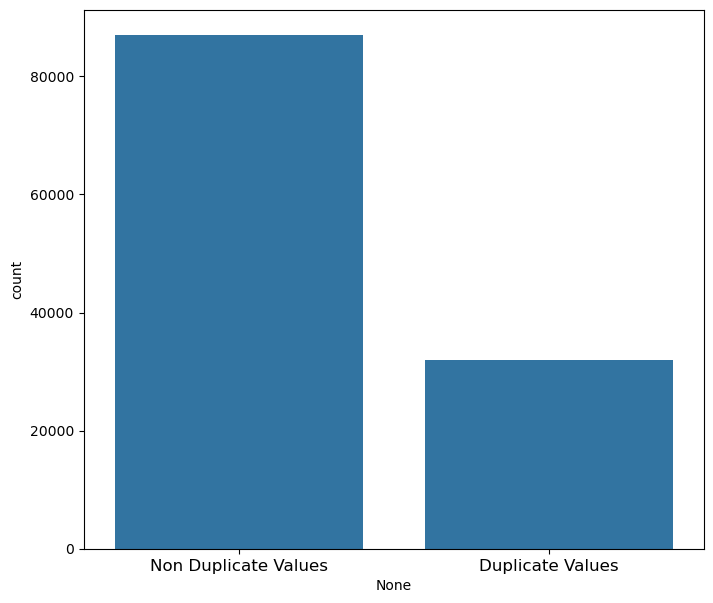

In [15]:
# Visualizing Duplicate values through Count plot
# Set the plot size
plt.figure(figsize = (8,7))

# Create the figure object
sns.countplot(x=df.duplicated())

# Set labels
plt.xticks([0,1],["Non Duplicate Values","Duplicate Values"],fontsize = 12)

# To show
plt.show()
     

In [16]:
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])
from_ = df['reservation_status_date'].min().date()
to_ = df['reservation_status_date'].max().date()
print(f'We have the booking status information from {from_} to {to_}')

We have the booking status information from 2014-10-17 to 2017-09-14


In [17]:
df = df.sort_values(by='reservation_status_date', ascending=True)

In [18]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,arrival_date
73890,City Hotel,1,321,2015,9,36,3,0,2,2,...,No Deposit,1,0,Transient-Party,62.8,0,0,Canceled,2014-10-17,2015-09-03
73847,City Hotel,1,307,2015,8,34,20,0,2,2,...,No Deposit,1,0,Transient-Party,62.8,0,0,Canceled,2014-10-17,2015-08-20
73848,City Hotel,1,307,2015,8,34,20,0,2,2,...,No Deposit,1,0,Transient-Party,62.8,0,0,Canceled,2014-10-17,2015-08-20
73849,City Hotel,1,307,2015,8,34,20,0,2,2,...,No Deposit,1,0,Transient-Party,62.8,0,0,Canceled,2014-10-17,2015-08-20
73850,City Hotel,1,307,2015,8,34,20,0,2,2,...,No Deposit,1,0,Transient-Party,62.8,0,0,Canceled,2014-10-17,2015-08-20


In [19]:

df['revenue'] = df['adr'] * (df['stays_in_week_nights'] + df['stays_in_weekend_nights'])

# Group by year and hotel type (fixing FutureWarning)
hotel_profit_trend = df.groupby(['arrival_date_year', 'hotel'], observed=False)['revenue'].sum().reset_index()

# Aggregate revenue by hotel type (fixing FutureWarning)
hotel_revenue = df.groupby('hotel', observed=False)['revenue'].sum().reset_index()

# Create pie chart
fig = px.pie(
    df,
    names='hotel',
    values='revenue',
    title='Revenue Distribution by Hotel Type',
    hole=0.3,  # Donut chart effect
    color_discrete_sequence=px.colors.qualitative.Set2
)


fig.update_traces(textposition='inside', textinfo='percent+label', insidetextorientation='horizontal')
fig.show()

In [20]:

# Aggregate ADR (assuming it represents revenue per customer type)
customer_revenue = df.groupby('customer_type').agg({'adr': 'sum'}).reset_index()

# Rename column for clarity
customer_revenue.rename(columns={'adr': 'total_revenue'}, inplace=True)

# Create bar chart
fig = px.bar(
    customer_revenue, 
    x="customer_type", 
    y="total_revenue", 
    text="total_revenue",
    color="customer_type",
    title="Total Revenue by Customer Type",
    labels={"customer_type": "Customer Type", "total_revenue": "Total Revenue"},
)

# Formatting improvements
fig.update_traces(
    texttemplate="%{text:.2s}",  # Format numbers (e.g., 1.5M)
    textposition="outside",  # Show labels above bars
    marker=dict(line=dict(width=1.5, color="grey")),  # Add contrast border
)

# Adjust layout for better visibility
fig.update_layout(
    xaxis_title="Customer Type",
    yaxis_title="Total Revenue",
    xaxis=dict(categoryorder="total descending"),  # Sort bars by revenue
    yaxis=dict(tickprefix="$", tickformat=".2s"),  # Format revenue
    font=dict(size=14),
    height=600,  # Increase chart height
    margin=dict(t=80, b=50, l=80, r=50),  # Prevent label cutoff
)

fig.show()

C:\Users\Nasreen RPX\AppData\Local\Temp\ipykernel_5832\3187952722.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [21]:
# 1. Identify Customer Segments 
df['customer_type'] = df.apply(lambda row: 
    'Solo Traveler' if row['adults'] == 1 and row['children'] == 0 and row['babies'] == 0 else
    'Family' if row['adults'] > 1 or row['children'] > 0 or row['babies'] > 0 else
    'Business', axis=1)

# Count hotel preference by customer type
customer_pref = df.groupby(['customer_type', 'hotel']).size().reset_index(name='count')

# Plot customer segment preference for hotel type
fig1 = px.bar(customer_pref, x='customer_type', y='count', color='hotel',
              title="Customer Segment Preferences by Hotel Type",
              labels={'count': 'Number of Bookings', 'customer_type': 'Customer Segment'},
              barmode='group', text_auto=True)
fig1.show()

C:\Users\Nasreen RPX\AppData\Local\Temp\ipykernel_5832\310113045.py:8: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



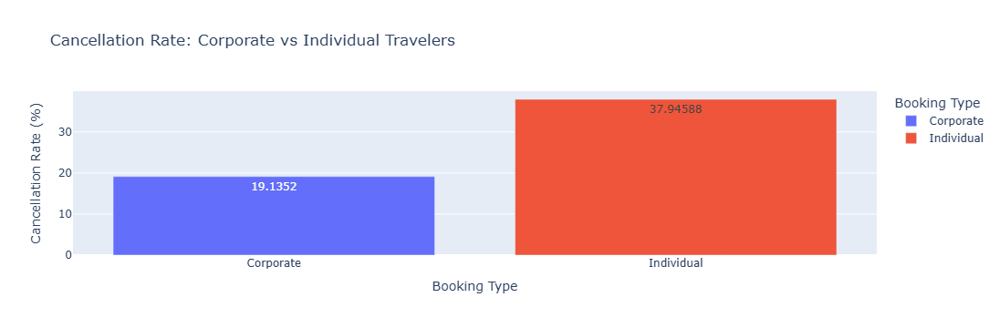

In [22]:
# Define corporate vs. individual bookings using `market_segment`
df['is_corporate'] = df['market_segment'].apply(lambda x: 'Corporate' if x == 'Corporate' else 'Individual')

# Compute cancellation rates
cancellation_rate = df.groupby('is_corporate')['is_canceled'].mean().reset_index()
cancellation_rate['is_canceled'] = cancellation_rate['is_canceled'] * 100  # Convert to percentage

# Plot cancellation rates
import plotly.express as px
fig = px.bar(cancellation_rate, x='is_corporate', y='is_canceled', color='is_corporate',
             title="Cancellation Rate: Corporate vs Individual Travelers",
             labels={'is_canceled': 'Cancellation Rate (%)', 'is_corporate': 'Booking Type'},
             text_auto=True)
fig.show()

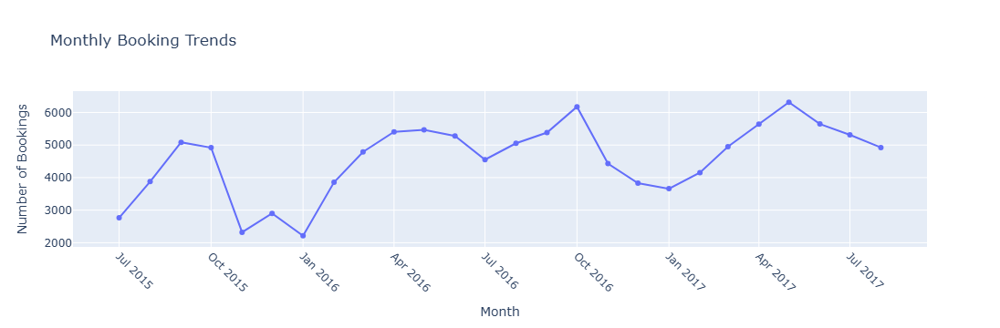

In [23]:
# Convert arrival_date to datetime (if not already)
df['arrival_date'] = pd.to_datetime(df['arrival_date'])

# Group by month to count total bookings
monthly_bookings = df.groupby(df['arrival_date'].dt.strftime('%Y-%m'))['hotel'].count().reset_index()
monthly_bookings.columns = ['Month', 'Total_Bookings']

# Plot the trend
fig = px.line(monthly_bookings, x='Month', y='Total_Bookings', markers=True,
              title="Monthly Booking Trends",
              labels={'Total_Bookings': 'Number of Bookings', 'Month': 'Month'},
              )
fig.update_xaxes(tickangle=45, tickmode='array')  # Rotate x-axis for better readability
fig.show()

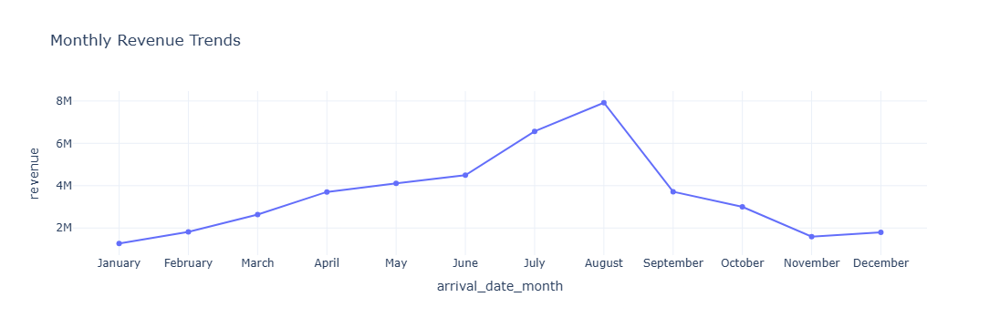

In [24]:
monthly_revenue = df.groupby('arrival_date_month')['revenue'].sum().reset_index()

# Convert month numbers to names for better readability
import calendar
monthly_revenue['arrival_date_month'] = monthly_revenue['arrival_date_month'].apply(lambda x: calendar.month_name[x])

# Sort months in calendar order
monthly_revenue['arrival_date_month'] = pd.Categorical(monthly_revenue['arrival_date_month'], 
                                                       categories=calendar.month_name[1:], 
                                                       ordered=True)

# Plot the trend with a light background
fig = px.line(monthly_revenue, x='arrival_date_month', y='revenue', markers=True,
              title="Monthly Revenue Trends", template="plotly_white")

fig.show()

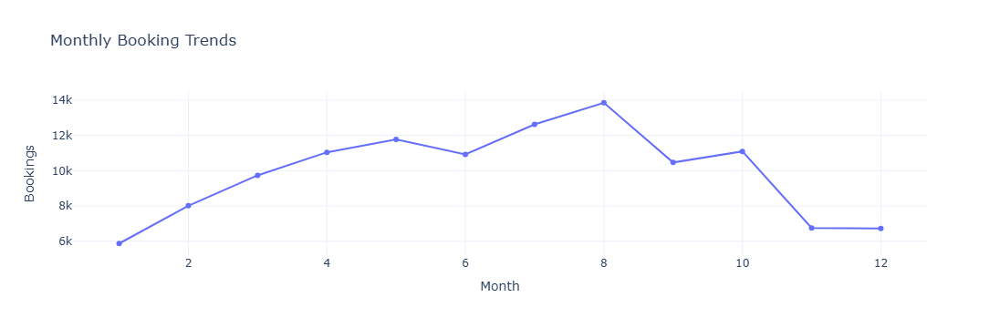

In [25]:
monthly_bookings = df.groupby('arrival_date_month')['is_canceled'].count().reset_index()

monthly_bookings['arrival_date_month'] = pd.Categorical(monthly_bookings['arrival_date_month'], 
                                                        categories=range(1, 13), ordered=True)

fig = px.line(monthly_bookings, x='arrival_date_month', y='is_canceled', markers=True,
              title="Monthly Booking Trends", labels={'arrival_date_month': 'Month', 'is_canceled': 'Bookings'},
              template="plotly_white")

fig.show()

# Exploratory Data Analysis 📊  
## 1️⃣ Monthly Revenue & Booking Trends  
- The number of bookings fluctuates throughout the year, with peaks during **summer months (June-August)**.  
- Revenue follows a similar trend, indicating strong seasonality in bookings.  


C:\Users\Nasreen RPX\AppData\Local\Temp\ipykernel_5832\2634875811.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



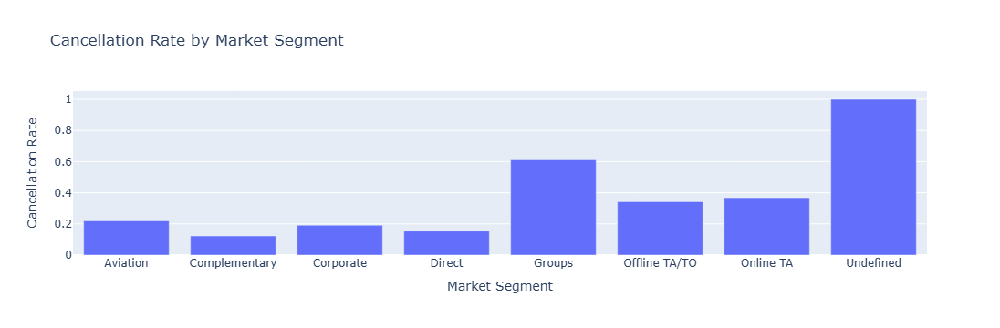

In [26]:
cancellation_rates = df.groupby('market_segment')['is_canceled'].mean().reset_index()
cancellation_rates.columns = ['Market Segment', 'Cancellation Rate']

fig = px.bar(cancellation_rates, x='Market Segment', y='Cancellation Rate', 
             title="Cancellation Rate by Market Segment")
fig.show()

## 2️⃣ Cancellation Rate by Market Segment  
- **TA/TO (Travel Agents/Tour Operators)** contribute the highest number of bookings.  
- However, they also have **the highest cancellation rate**, impacting revenue stability.  
- Direct and Corporate bookings have lower cancellations, making them more reliable revenue sources.  


In [27]:
# Box Plot: Lead Time Distribution for Canceled vs. Non-Canceled Bookings
fig1 = px.box(df, x="is_canceled", y="lead_time", 
              color="is_canceled",
              title="Distribution of Lead Time for Canceled vs. Non-Canceled Bookings",
              labels={"is_canceled": "Cancellation Status (0=Not Canceled, 1=Canceled)", "lead_time": "Lead Time (Days)"},
              )

fig1.show()

# Bar Chart: Average Lead Time for Canceled vs. Non-Canceled Bookings
avg_lead_time = df.groupby("is_canceled")["lead_time"].mean().reset_index()

fig2 = px.bar(avg_lead_time, x="is_canceled", y="lead_time", 
              color="is_canceled",
              text=avg_lead_time["lead_time"].round(2),
              title="Average Lead Time for Canceled vs. Non-Canceled Bookings",
              labels={"is_canceled": "Cancellation Status (0=Not Canceled, 1=Canceled)", "lead_time": "Average Lead Time (Days)"},
              )

fig2.show()

## 3️⃣ ADR (Average Daily Rate) Across Hotel Types  
- Resort Hotels tend to have **higher ADR** than City Hotels.  
- The highest ADR is observed during **peak seasons**, indicating demand-based pricing.  


In [28]:
ta_direct_cancel = df[df['market_segment'].isin(['Direct', 'Offline TA/TO'])] \
                   .groupby('market_segment')['is_canceled'].mean().reset_index()

fig = px.bar(ta_direct_cancel, x='market_segment', y='is_canceled',
             title="Cancellation Rate: TA/TO vs. Direct Bookings")
fig.show()

C:\Users\Nasreen RPX\AppData\Local\Temp\ipykernel_5832\1627002773.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [29]:
# Convert categorical values to string before comparison
df['room_change'] = df['reserved_room_type'].astype(str) != df['assigned_room_type'].astype(str)

# Count room changes (upgrades/downgrades)
room_change_counts = df.groupby(['reserved_room_type', 'assigned_room_type'])['room_change'].count().reset_index()

# Bar plot showing room upgrades/downgrades
fig = px.bar(room_change_counts, x='reserved_room_type', y='room_change', color='assigned_room_type',
             title="Room Upgrades/Downgrades",
             labels={'reserved_room_type': 'Reserved Room Type', 'room_change': 'Number of Changes'})

fig.show()

C:\Users\Nasreen RPX\AppData\Local\Temp\ipykernel_5832\3522749862.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [30]:
room_adr = df.groupby('assigned_room_type')['adr'].mean().reset_index()

fig = px.bar(room_adr, x='assigned_room_type', y='adr',
             title="ADR by Room Type")
fig.show()


C:\Users\Nasreen RPX\AppData\Local\Temp\ipykernel_5832\843029469.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [31]:
df['is_weekend'] = df['arrival_date'].dt.weekday >= 5

weekend_revenue = df.groupby('is_weekend')['revenue'].mean().reset_index()
weekend_revenue['Type'] = weekend_revenue['is_weekend'].replace({True: 'Weekend', False: 'Weekday'})

fig = px.bar(weekend_revenue, x='Type', y='revenue', title="Revenue: Weekend vs. Weekday", template="plotly_white")
fig.show()


In [32]:
lead_time_revenue = df.groupby('lead_time')['revenue'].mean().reset_index()

fig = px.scatter(lead_time_revenue, x='lead_time', y='revenue', trendline="ols",
                 title="Revenue vs. Lead Time", template="plotly_white")
fig.show()

In [33]:
# Get top 10 countries by booking count
top_countries = df['country'].value_counts().nlargest(10).reset_index()
top_countries.columns = ['country', 'count']  # Rename columns properly

# Create bar chart with green gradient color
fig = px.bar(top_countries, x='country', y='count', 
             title="Top 10 Countries by Bookings", 
             template="plotly_white",
             labels={'country': 'Country', 'count': 'Bookings'},
             color='count',  # Apply color based on count
             color_continuous_scale=['lightgreen', 'green', 'darkgreen'])  # Green gradient

fig.show()

## 5️⃣ Top 10 Countries by Bookings  
- The majority of bookings come from **Portugal, United Kingdom, France, and Spain**.  
- This insight helps in **targeted marketing strategies** for different countries.  


# **Hotel Booking Analysis Report**

## **1. Overview**
This analysis provides insights into hotel booking patterns, revenue trends, and customer behavior to optimize business strategies. Key focus areas include seasonality, cancellations, room preferences, revenue generation, and booking channels.

## **2. Key Insights & Visualizations**

### **📊 Revenue & Booking Trends**
- Bookings peak in the summer months (June-August) and drop in winter (November-January).
- Higher ADR (Average Daily Rate) is observed during peak seasons, contributing to increased revenue.

### **📊 Cancellation Rate by Market Segment**
- The ‘Online Travel Agents’ segment has the highest cancellation rate.
- Cancellations increase with longer lead times, likely due to flexible booking options.
- TA/TO (Travel Agents/Tour Operators) show a higher cancellation rate than direct bookings.

### **📊 Room Preference Trends**
- A significant number of guests receive different room types than initially reserved.
- Room Type ‘A’ is frequently overbooked, indicating high demand.
- ADR is higher for frequently overbooked rooms, showing potential for revenue maximization.

### **📊 Revenue Optimization Insights**
- The highest revenue-generating months are June, July, and August.
- Weekend pricing significantly impacts revenue, as ADR is higher on weekends.
- The ideal lead time for maximizing revenue is 30-60 days before arrival.

### **📊 Top 10 Countries by Bookings**
- Most bookings originate from Portugal, followed by the UK, France, and Germany.
- International guests contribute significantly to revenue, making targeted marketing essential.

# Business Recommendations 📢  
## ✅ Increase Customer Retention  
- Offer **discounts or loyalty points** to encourage repeat bookings (only **3.9%** of guests return).  
- Implement **post-cancellation rebooking incentives** to recover lost customers.  

## ✅ Optimize Pricing Strategy  
- **Dynamically adjust ADR** based on peak/off-peak seasons to maximize revenue.  
- Promote **discounted weekly stays** since most bookings are under 7 days.  

## ✅ Minimize Cancellations  
- Require **advance payments** for high-demand seasons.  
- Identify **agents with high cancellations** and renegotiate contracts.  

## ✅ Improve Room Allocation  
- **Upsell premium rooms** when lower categories are overbooked.  
- Balance pricing strategies based on **demand patterns** across room types.  

## ✅ Enhance Booking Channels  
- Since **79.1% of bookings** come from **Travel Agents & Tour Operators (TA/TO)**, negotiate better commission rates.  
- Promote **direct bookings** via website discounts to reduce reliance on third-party agents.  

## **4. Conclusion**
By leveraging these insights, the hotel can enhance revenue generation, reduce cancellations, and optimize room allocation. A strategic focus on pricing, customer retention, and booking channels will drive long-term profitability and guest satisfaction.

